# Capstone Step 3 Exploratory Data Analysis

<font color = 'teal'>Importing nessacary packages</font>

 **Exploratory Data Analysis involves** 
 * Build data profile tables and plots
 * Explore data relationships
 * Feature Selection

In [1]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import os
import seaborn as sns 
from scipy import stats
import cufflinks as cf
import plotly
import plotly.offline as py
import plotly.graph_objs as go
from IPython.core.display import Image

In [ ]:
! pip install cufflinks

<font color='cyan'>Loading the csv file which is created in the end of step 2 from the data  folder.</font>


In [2]:
#Loading the csv file and storing it in a variable df 
df = pd.read_csv('covid_updated_file.csv')

In [3]:
#Printing the current working directory
os.getcwd()

'C:\\Users\\user\\Springboard\\Course\\CapStone - 1'

In [4]:
#printing the first five rows of the dataframe df
df.head()

,Unnamed: 0,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,0.0000,597.029,9.59,0.0,0.0,37.746,0.5,64.83
1,1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
2,2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
3,3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
4,4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83


In [5]:
#Using info() print the count of nan values in the column of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33963 entries, 0 to 33962
Data columns (total 35 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unnamed: 0                       33963 non-null  int64  
 1   iso_code                         33963 non-null  object 
 2   continent                        33963 non-null  object 
 3   location                         33963 non-null  object 
 4   date                             33963 non-null  object 
 5   total_cases                      33963 non-null  float64
 6   new_cases                        33963 non-null  float64
 7   total_deaths                     33963 non-null  float64
 8   new_deaths                       33963 non-null  float64
 9   total_cases_per_million          33963 non-null  float64
 10  new_cases_per_million            33963 non-null  float64
 11  total_deaths_per_million         33963 non-null  float64
 12  new_deaths_per_mil

In [6]:
#Printing the unique values of the location column
df['location'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao', 'Cyprus',
       'Czech Republic', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Faeroe Islands', 'Falkland Isla

<font color = 'cyan'>Build data profile tables and plots</font>

In [7]:
#Priting the summary statistics of the dataframe df in transposed manner
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,33963.0,1.698100e+04,9.804418e+03,0.000,8.490500e+03,1.698100e+04,2.547150e+04,3.396200e+04
total_cases,33963.0,2.680710e+04,1.666832e+05,0.000,2.100000e+01,4.430000e+02,5.044000e+03,4.620444e+06
new_cases,33963.0,5.253062e+02,3.299174e+03,-2461.000,0.000000e+00,5.000000e+00,9.950000e+01,7.842700e+04
total_deaths,33963.0,1.371855e+03,7.912473e+03,0.000,0.000000e+00,9.000000e+00,1.070000e+02,1.544470e+05
new_deaths,33963.0,2.017708e+01,1.223804e+02,-1918.000,0.000000e+00,0.000000e+00,2.000000e+00,4.928000e+03
total_cases_per_million,33963.0,1.139858e+03,2.748348e+03,0.000,8.521000e+00,1.597880e+02,9.628520e+02,3.849660e+04
new_cases_per_million,33963.0,1.807989e+01,6.281985e+01,-265.189,0.000000e+00,7.540000e-01,1.073250e+01,4.944376e+03
total_deaths_per_million,33963.0,4.169037e+01,1.244590e+02,0.000,0.000000e+00,2.115000e+00,2.238950e+01,1.237551e+03
new_deaths_per_million,33963.0,5.303312e-01,2.973074e+00,-41.023,0.000000e+00,0.000000e+00,1.370000e-01,2.000400e+02
new_tests,33963.0,1.347412e+04,4.673072e+04,-3743.000,9.995945e+02,3.285338e+03,1.027331e+04,9.298380e+05


In [8]:
df[['iso_code','location']]

,iso_code,location
0,AFG,Afghanistan
1,AFG,Afghanistan
2,AFG,Afghanistan
3,AFG,Afghanistan
4,AFG,Afghanistan
...,...,...
33958,ZWE,Zimbabwe
33959,ZWE,Zimbabwe
33960,ZWE,Zimbabwe
33961,ZWE,Zimbabwe


 The ISO country codes are internationally recognized codes that designate every country and most of the dependent areas a two-letter combination or a three-letter combination; it is like an acronym, that stands for a country or a state. Therefore dropping iso_code from the dataframe df.

In [9]:
#Drop the iso_code column from the dataframe df using df.drop()
df=df.drop(columns=['iso_code'],axis=1)
#Drop the column Unnamed: 0 from the dataframe df
df=df.drop(columns=['Unnamed: 0'],axis=1)
#Printing the first five rows
df.head()

,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,0.0000,597.029,9.59,0.0,0.0,37.746,0.5,64.83
1,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
2,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
3,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
4,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83


<font color = 'cyan'>Boxplots</font>

In [10]:
#printing the columns of the dataframe df
df.columns

Index(['continent', 'location', 'date', 'total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy'],
      dtype='object')

Box plots are very effective in getting info about outliers
Plotting box plot for each column 

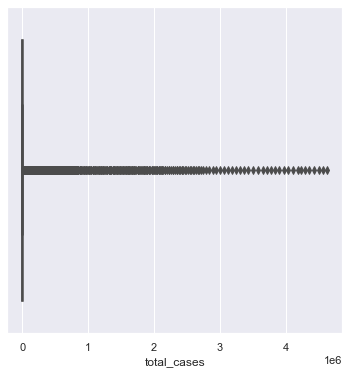

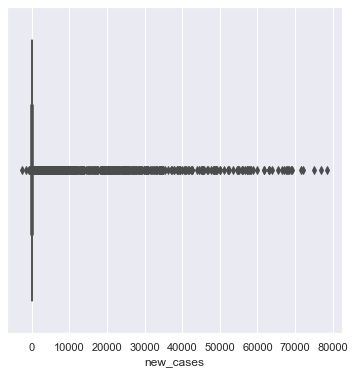

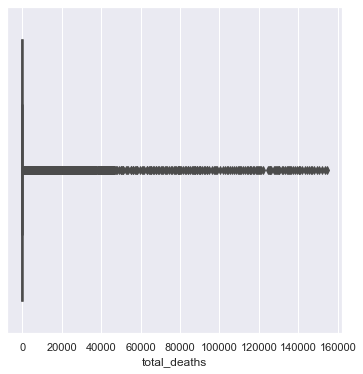

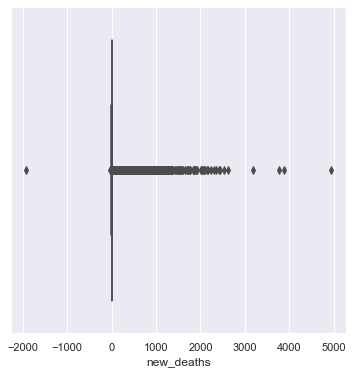

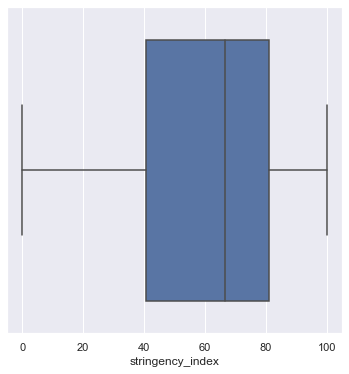

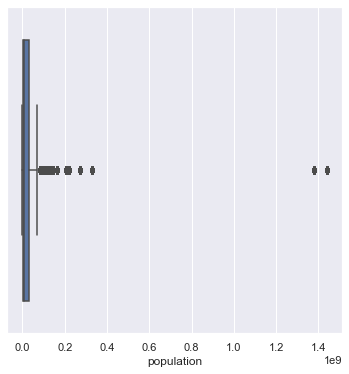

In [11]:
sns.set(rc ={"figure.figsize":(6,6)})
sns.boxplot(x=df['total_cases'])
plt.show()
sns.boxplot(x=df['new_cases'])
plt.show()
sns.boxplot(x=df['total_deaths'])
plt.show()
sns.boxplot(x=df['new_deaths'])
plt.show()
sns.boxplot(x=df['stringency_index'])
plt.show()
sns.boxplot(x=df['population'])
plt.show()

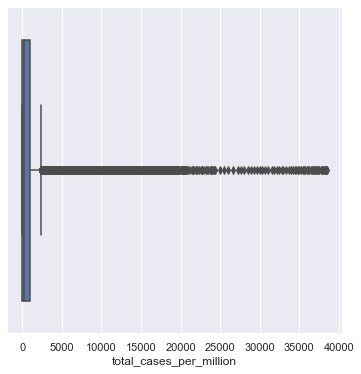

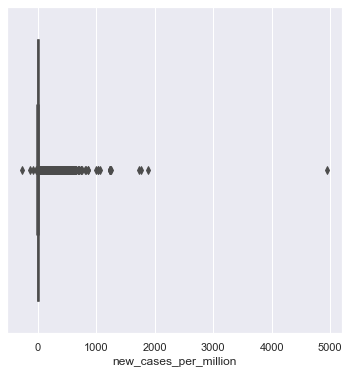

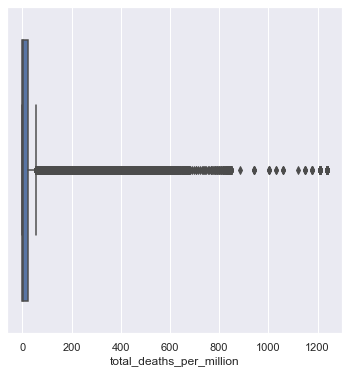

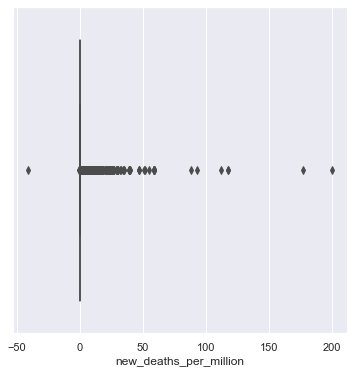

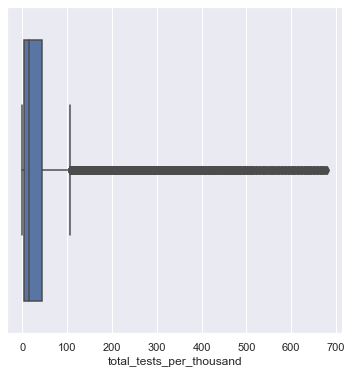

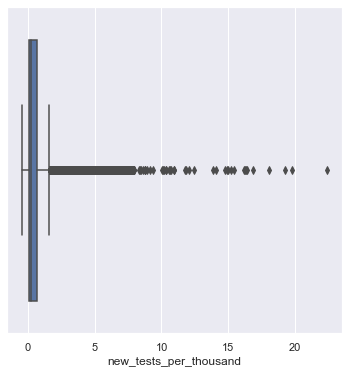

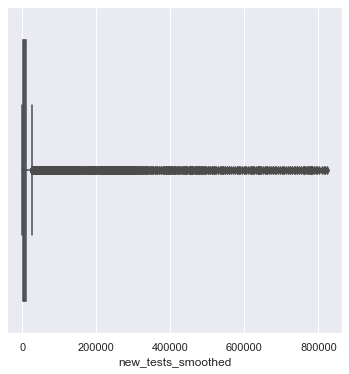

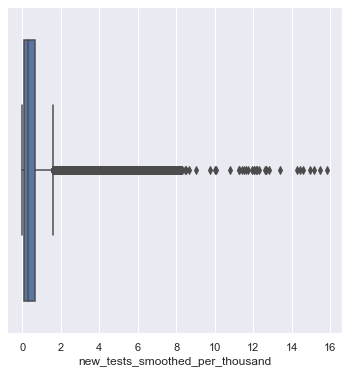

In [12]:
sns.boxplot(x=df['total_cases_per_million'])
plt.show()
sns.boxplot(x=df['new_cases_per_million'])
plt.show()
sns.boxplot(x=df['total_deaths_per_million'])
plt.show()
sns.boxplot(x=df['new_deaths_per_million'])
plt.show()
sns.boxplot(x=df['total_tests_per_thousand'])
plt.show()
sns.boxplot(x=df['new_tests_per_thousand'])
plt.show()
sns.boxplot(x=df['new_tests_smoothed'])
plt.show()
sns.boxplot(x=df['new_tests_smoothed_per_thousand'])
plt.show()

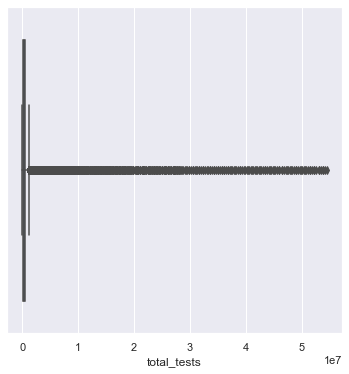

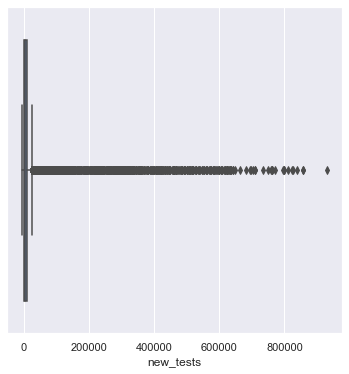

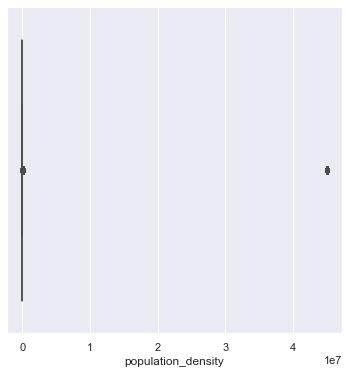

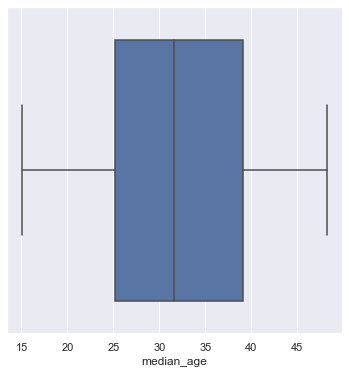

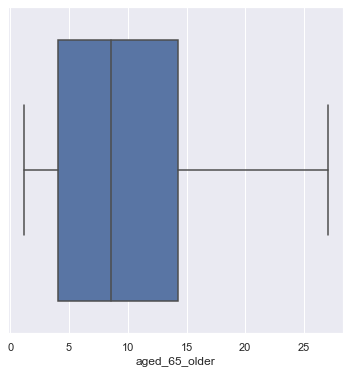

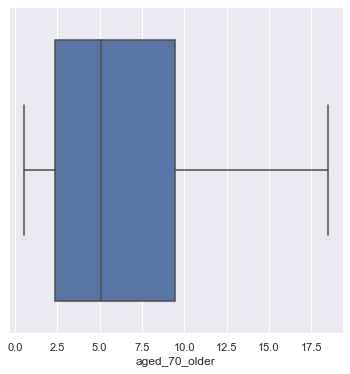

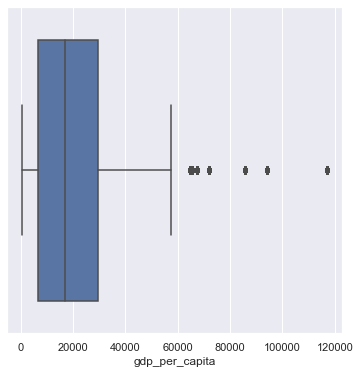

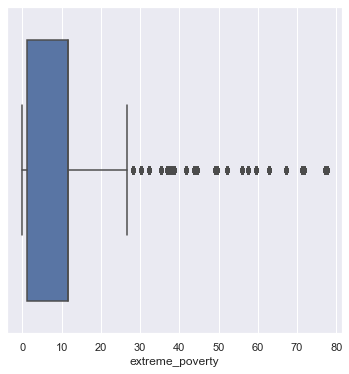

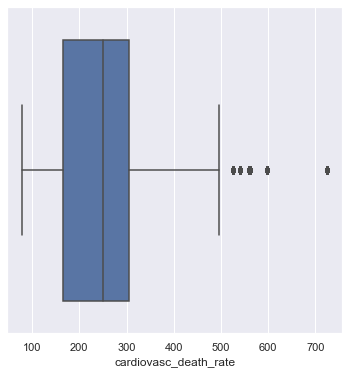

In [13]:
sns.boxplot(x=df['total_tests'])
plt.show()
sns.boxplot(x=df['new_tests'])
plt.show()
sns.boxplot(x=df['population_density'])
plt.show()
sns.boxplot(x=df['median_age'])
plt.show()
sns.boxplot(x=df['aged_65_older'])
plt.show()
sns.boxplot(x=df['aged_70_older'])
plt.show()
sns.boxplot(x=df['gdp_per_capita'])
plt.show()
sns.boxplot(x=df['extreme_poverty'])
plt.show()
sns.boxplot(x=df['cardiovasc_death_rate'])
plt.show()  

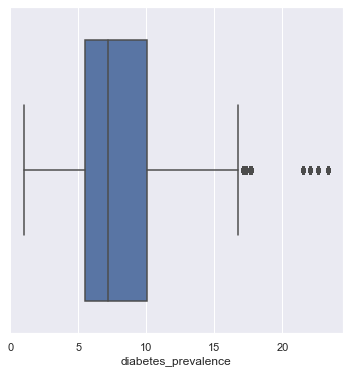

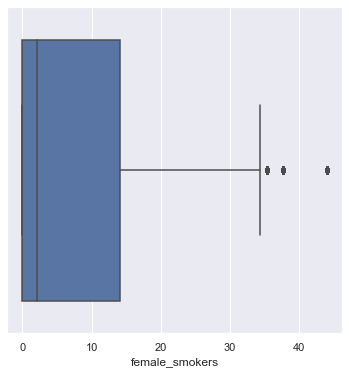

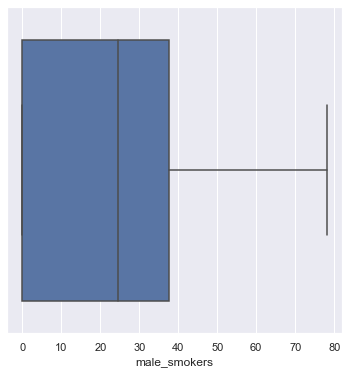

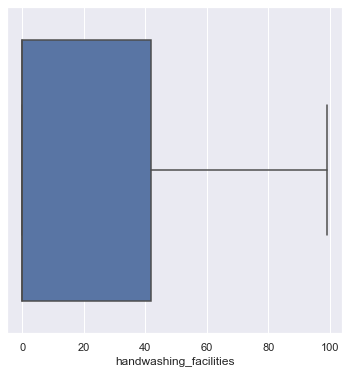

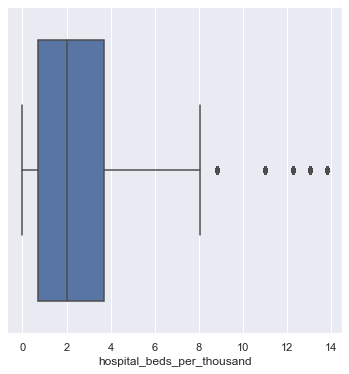

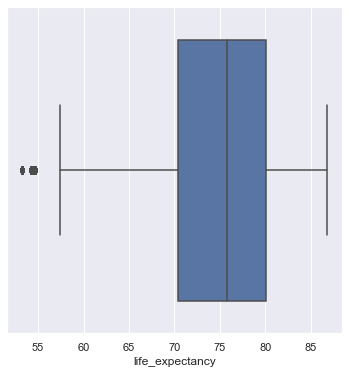

In [14]:
sns.boxplot(x=df['diabetes_prevalence'])
plt.show()
sns.boxplot(x=df['female_smokers'])
plt.show()
sns.boxplot(x=df['male_smokers'])
plt.show()
sns.boxplot(x=df['handwashing_facilities'])
plt.show()
sns.boxplot(x=df['hospital_beds_per_thousand'])
plt.show()  
sns.boxplot(x=df['life_expectancy'])
plt.show()  

In [15]:
df.shape

(33963, 33)

<font color = 'teal'>Removing outliers using the Interquartile range</font>

In [16]:
for loc in df['location'].unique():
    # Calculating the lower quartile for a location and storing in Q1
    Q1=df[df['location'] == loc].quantile(0.25)
    #calculating the upper quartile  for a locationand storing in Q3
    Q3=df[df['location'] == loc].quantile(0.75)
    #Calculating interquartile range and storing in IQR
    IQR = Q3 - Q1
    #Call the variable df and store the following calculated values(filtering the outliers from the  dataframe)
    df[df['location'] == loc] = df[df['location'] == loc][~((df[df['location'] == loc] < (Q1 - 1.5 * IQR)) |(df[df['location'] == loc]> (Q3 + 1.5 * IQR))).any(axis=1)] 

In [17]:
df = df.dropna(how = 'any')
df.shape

(26081, 33)

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26081 entries, 1 to 33935
Data columns (total 33 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   continent                        26081 non-null  object 
 1   location                         26081 non-null  object 
 2   date                             26081 non-null  object 
 3   total_cases                      26081 non-null  float64
 4   new_cases                        26081 non-null  float64
 5   total_deaths                     26081 non-null  float64
 6   new_deaths                       26081 non-null  float64
 7   total_cases_per_million          26081 non-null  float64
 8   new_cases_per_million            26081 non-null  float64
 9   total_deaths_per_million         26081 non-null  float64
 10  new_deaths_per_million           26081 non-null  float64
 11  new_tests                        26081 non-null  float64
 12  total_tests       

In [19]:
df.head()

,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
1,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
2,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
3,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
4,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83
5,Asia,Afghanistan,2020-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,11.5572,597.029,9.59,0.0,0.0,37.746,0.5,64.83


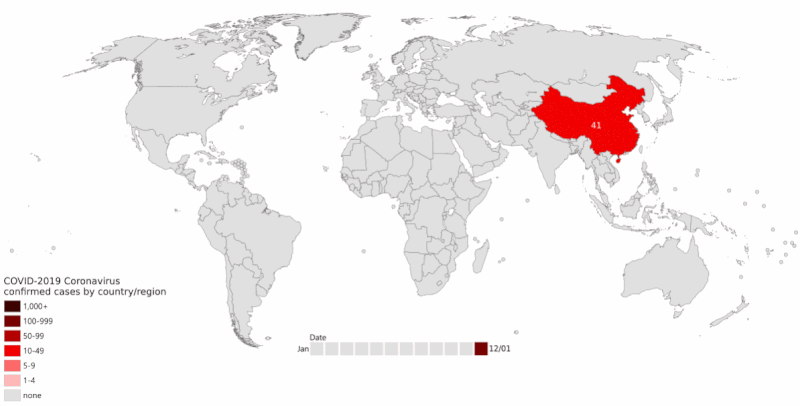

In [20]:
Image(filename='COVID-19-outbreak_1.gif')

The above image shows the number of active Coronavirus (COVID-19) cases by country over time (up to february 29, 2020).

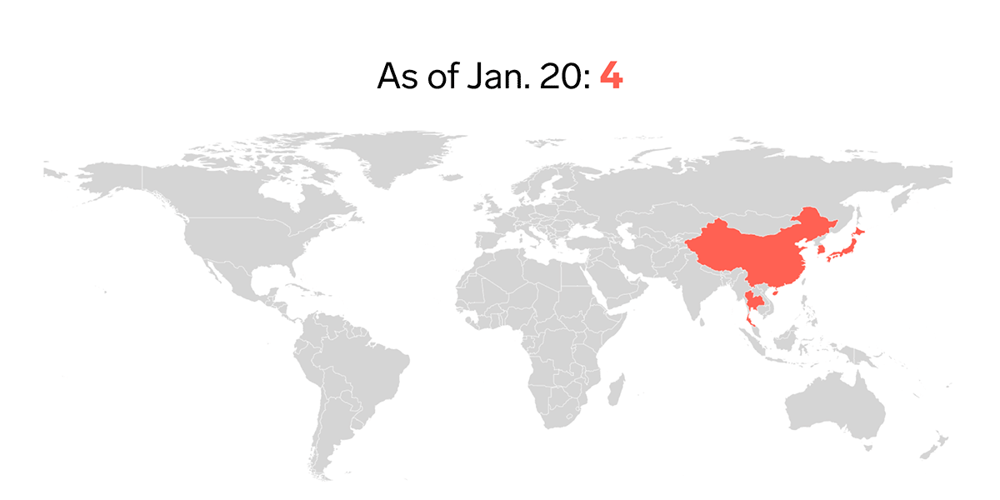

In [21]:
Image(filename='countries_timeline-series.gif')

The above image shows number of countries impacted by COVID-19 over time

<font color = 'teal'>Univariate data explorations </font>

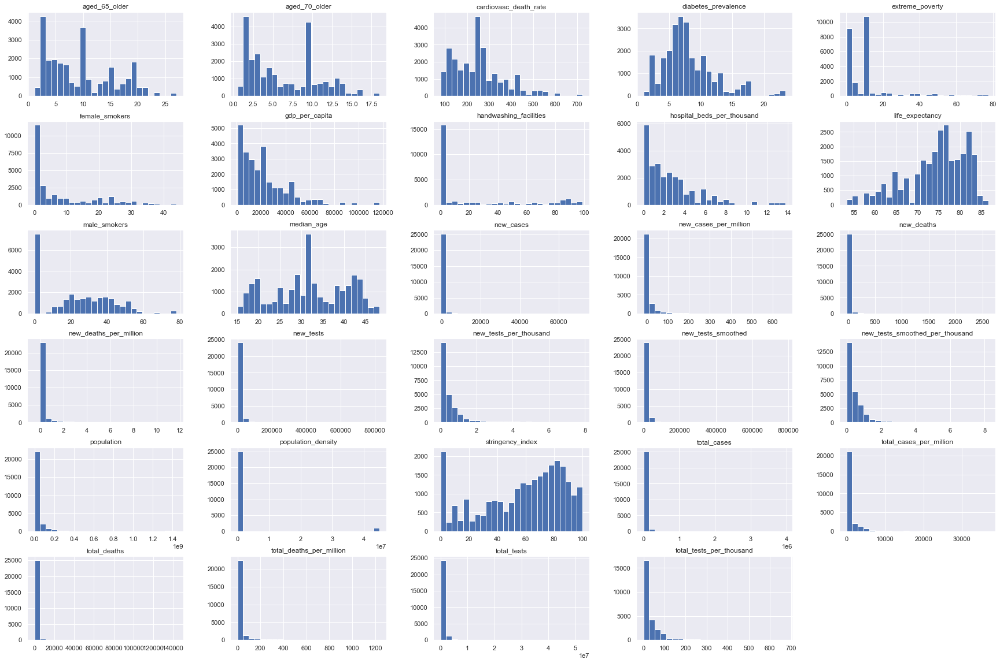

In [22]:
box=df.hist(bins=25,figsize =(30,20))
plt.show()

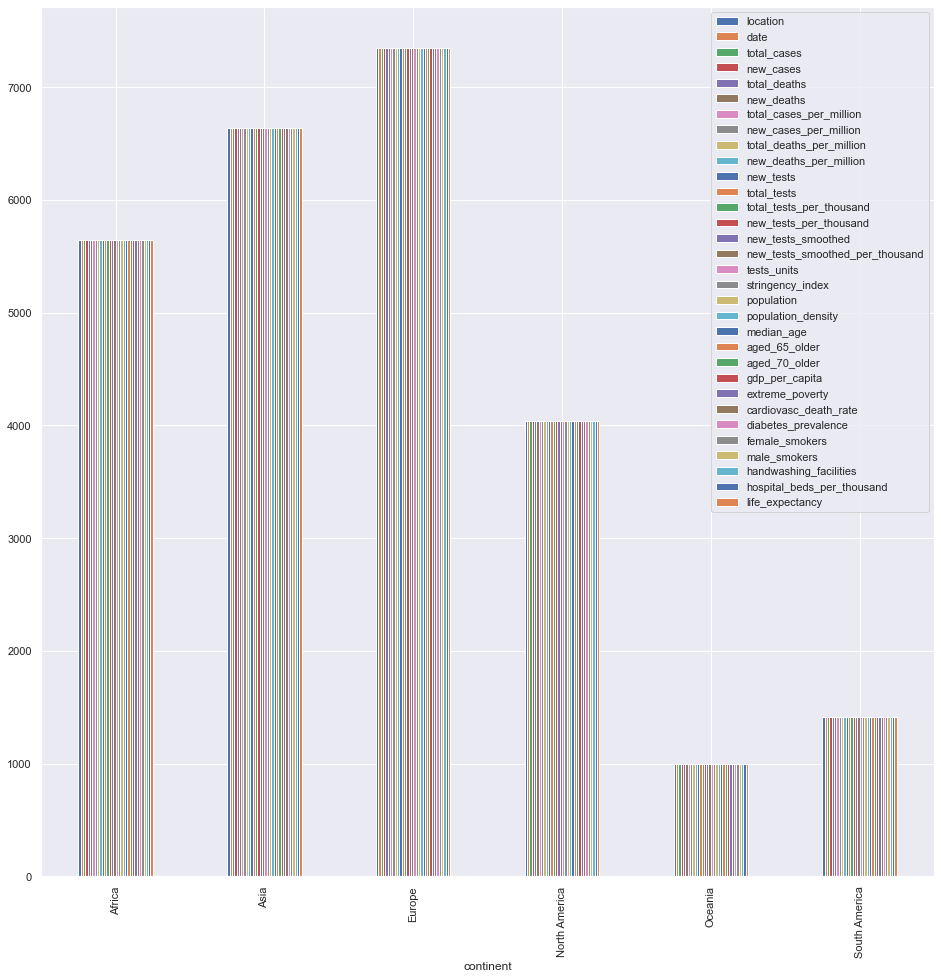

In [23]:
df.groupby('continent').count().plot(kind='bar',figsize =(16,16))

<font color ='teal'> Bivariate data explorations </font>

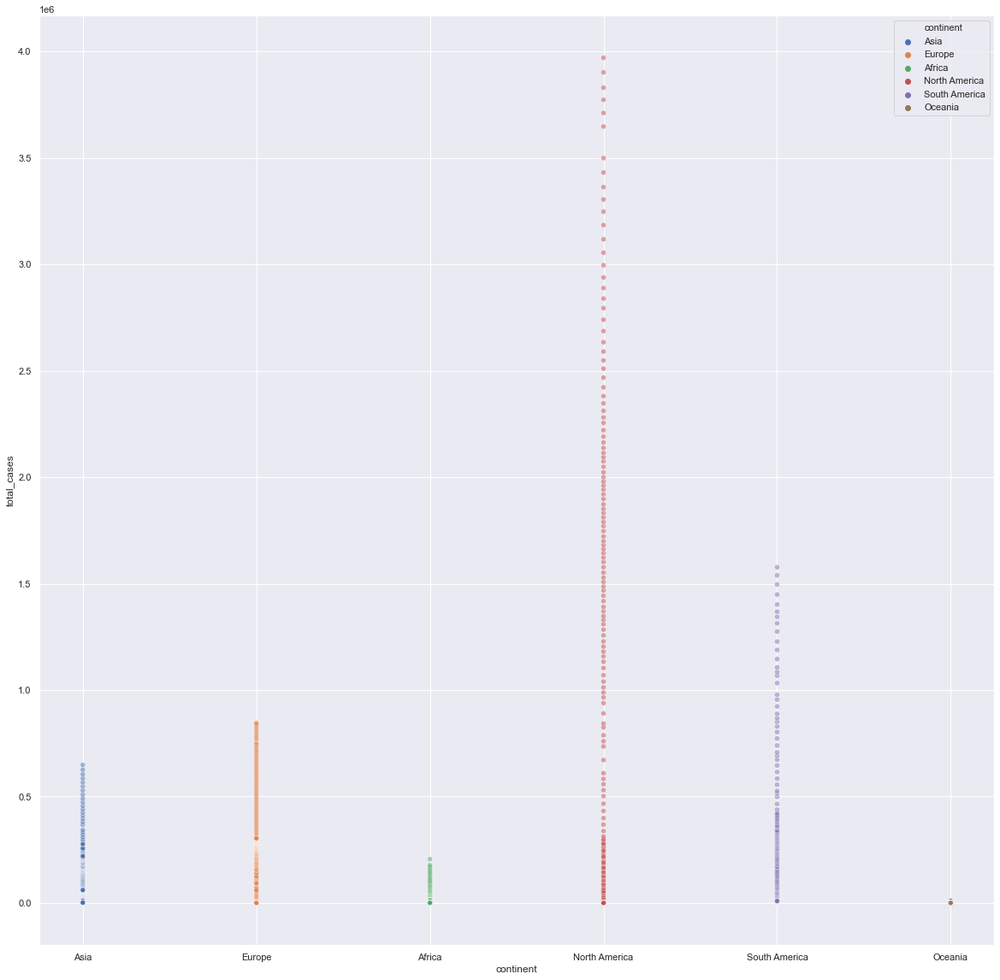

In [24]:
sns.set(rc ={"figure.figsize":(20,20)})
sns.scatterplot(x='continent',y = 'total_cases' , data = df,alpha = 0.5,hue ='continent')

From the above scatter plot we can see that North America have more no of covid-19 cases compared to others continents and Oceania(Australia) have least count of covid-19 cases. 

In [25]:
US_Brazil = df[ (df['location']=='United States') | (df['location'] == 'Brazil')]

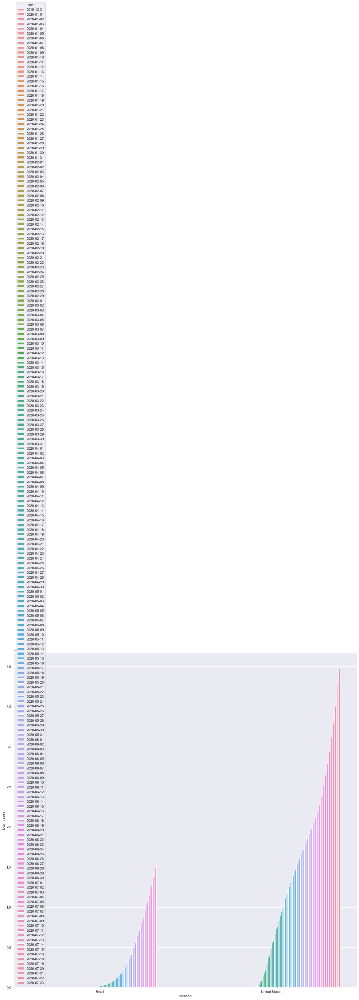

In [26]:
sns.set(rc ={"figure.figsize":(20,20)})
sns.barplot(x='location',y='total_cases',data=US_Brazil,hue ='date')
plt.show()

From the above barplot we can observe that the first confirmed cases of covid-19 in United States was reported on march month of 2020 and the count drastically increased. And first covid-19 confirmed cases in Brazil was reported on april month of 2020. Comparing to United States the count is less, though it also have drastic increase in covid-19 case count.

In [27]:
China_India = df[(df['location']=='China') | (df['location']=='India')]

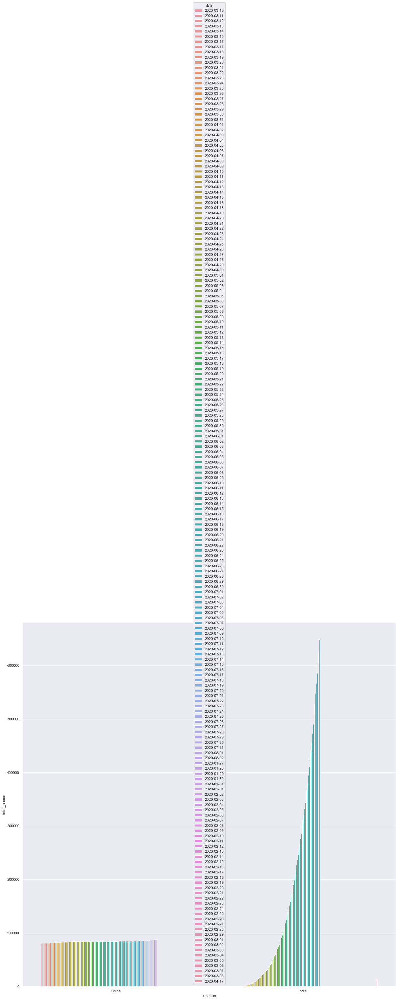

In [28]:
sns.set(rc={'figure.figsize': (20,20)})
sns.barplot(x='location',y='total_cases',data=China_India,hue ='date')
plt.show()

The outbreak was first identified in Wuhan, China, in December 2019. From the above bar plot we can observe the same. Even though it started very early in China we can observe a flattened curve. The first covid-19 case in India was reported in March,2020 and had a drastic increase in total numbers of cases when compared with China.

In [29]:
spain_germany = df[(df['location']=='Spain') | (df['location'] == 'Germany')]

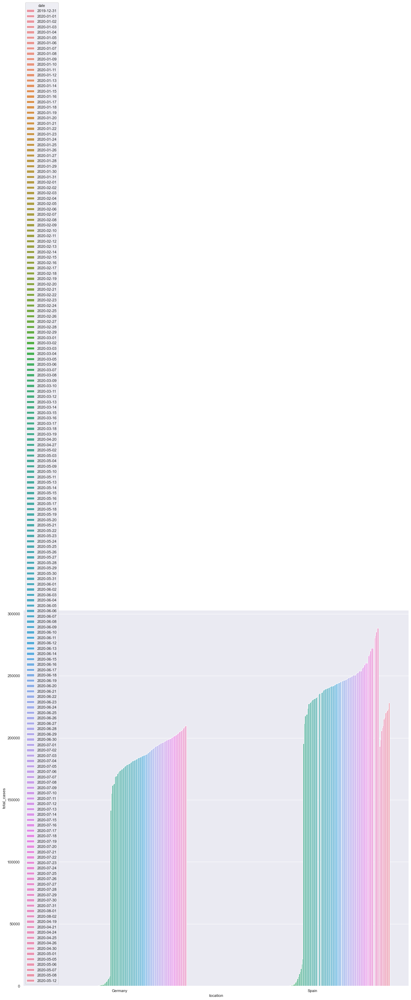

In [30]:
sns.set(rc={'figure.figsize': (20,20)})
sns.barplot(x='location',y='total_cases',data=spain_germany,hue ='date')
plt.show()

From the above barplot we can see that the first covid-19 case was almost reported around the same time both in Germany and Spain. And we can see a drastic increase in countin both countries. Spain has more cases when compared with Germany.

In [31]:
df['date'].min(), df['date'].max()

('2019-12-31', '2020-08-02')

In [32]:
#Getting latest cases
last_day_cases = df[df['date'] == '2020-08-02']

In [33]:
max_case_country = last_day_cases.sort_values(by = 'total_cases',ascending =  False)
#Printing the first 9 locations having more cases 
max_case_country[1:9]

,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
24537,South America,Peru,2020-08-02,422183.0,7448.0,19408.0,191.0,12804.348,225.890,588.623,...,4.455,12236.706,3.5000,85.755,5.95,4.8,0.0,0.000,1.60,76.74
32351,Europe,United Kingdom,2020-08-02,303952.0,771.0,46193.0,74.0,4477.388,11.357,680.450,...,12.527,39753.244,0.2000,122.137,4.28,20.0,24.7,0.000,2.54,81.32
26849,Asia,Saudi Arabia,2020-08-02,277478.0,1573.0,2867.0,1.0,7970.330,45.183,82.352,...,1.845,49045.411,11.5572,259.538,17.72,1.8,25.4,0.000,2.70,75.13
15963,Europe,Italy,2020-08-02,247832.0,295.0,35146.0,5.0,4098.983,4.879,581.292,...,16.240,35220.084,2.0000,113.151,4.78,19.8,27.8,0.000,3.18,83.51
2764,Asia,Bangladesh,2020-08-02,239860.0,2199.0,3132.0,21.0,1456.439,13.352,19.018,...,3.262,3523.984,14.8000,298.003,8.38,1.0,44.7,34.808,0.80,72.59
12087,Europe,Germany,2020-08-02,209893.0,240.0,9141.0,0.0,2505.170,2.865,109.102,...,15.957,45229.245,11.5572,156.139,8.31,28.2,33.1,0.000,8.00,81.33
5886,North America,Canada,2020-08-02,116585.0,287.0,8941.0,6.0,3088.986,7.604,236.897,...,10.797,44017.591,0.5000,105.599,7.37,12.0,16.6,0.000,2.50,82.43
6800,Asia,China,2020-08-02,87820.0,165.0,4667.0,6.0,61.015,0.115,3.242,...,5.929,15308.712,0.7000,261.899,9.74,1.9,48.4,0.000,4.34,76.91


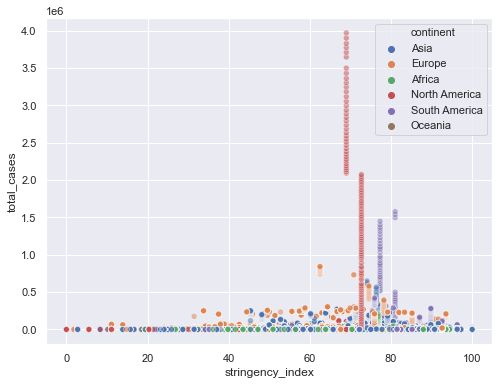

In [34]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'stringency_index', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

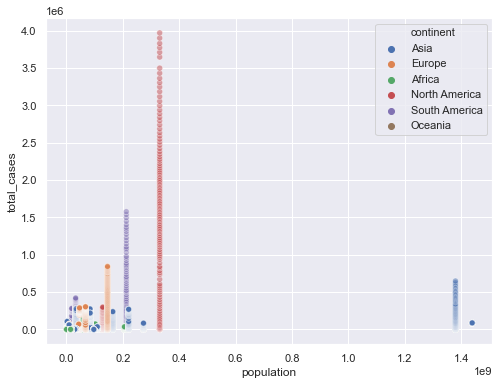

In [35]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'population', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

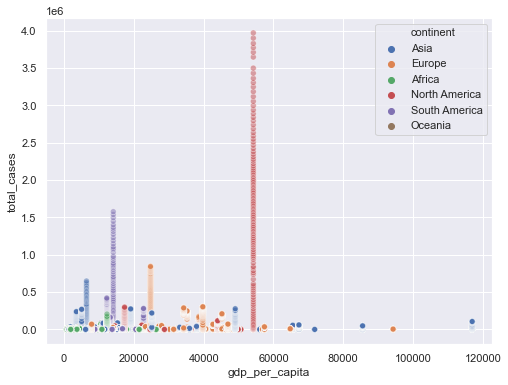

In [36]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'gdp_per_capita', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

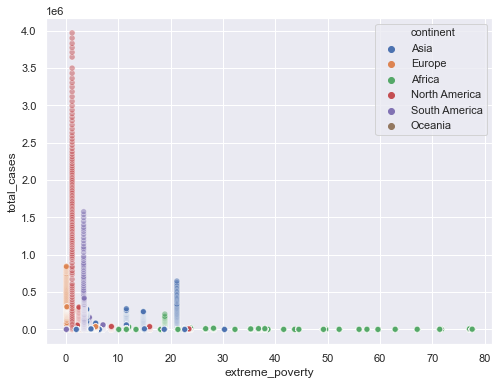

In [37]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'extreme_poverty', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

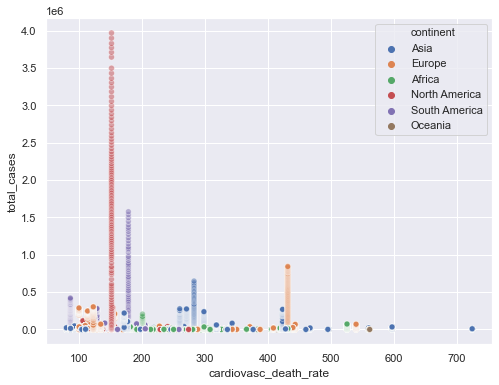

In [38]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'cardiovasc_death_rate', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

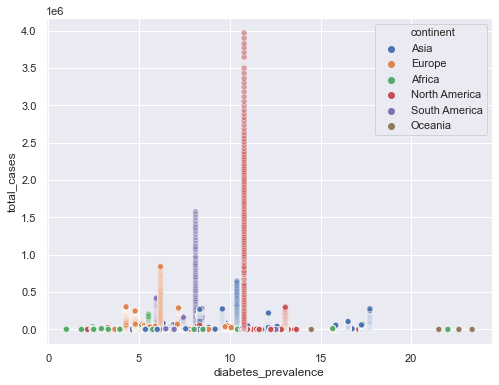

In [39]:
sns.set(rc ={'figure.figsize': (8,6)})
sns.scatterplot(x = 'diabetes_prevalence', y = 'total_cases',data = df,alpha = 0.5,color = 'g',hue = 'continent')

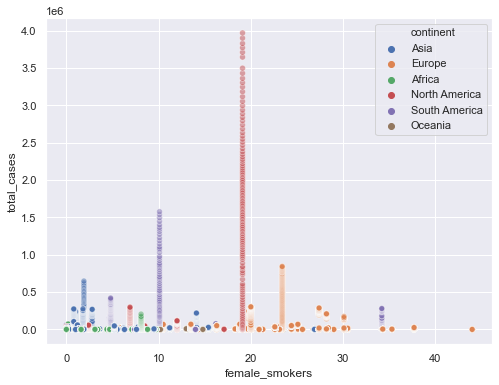

In [40]:
sns.scatterplot(x = 'female_smokers', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

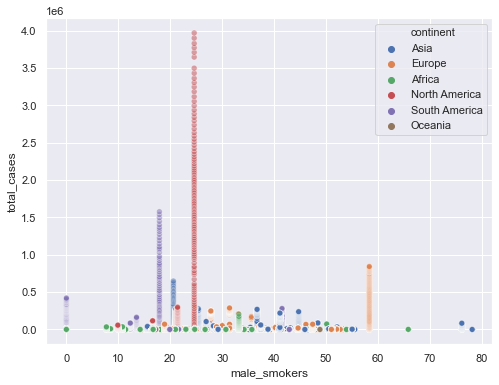

In [41]:
sns.scatterplot(x = 'male_smokers', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

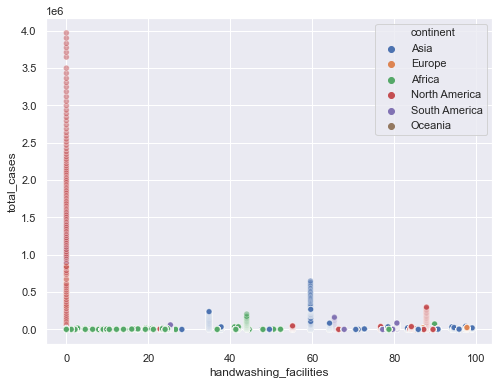

In [42]:
sns.scatterplot(x = 'handwashing_facilities', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

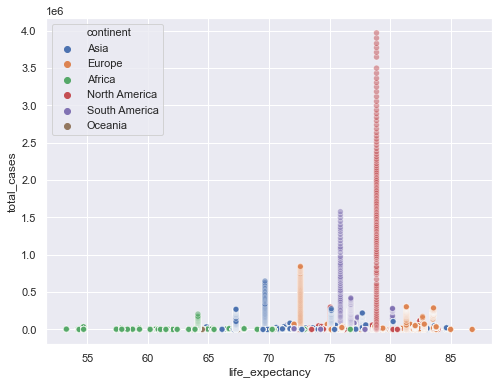

In [43]:
sns.scatterplot(x = 'life_expectancy', y ='total_cases' ,data = df,alpha = 0.5,color = 'g',hue = 'continent')

In [44]:
cf.go_offline() # required to use plotly offline (no account required).
py.init_notebook_mode() # graphs charts inline (IPython).

In [45]:
df.date = pd.to_datetime(df.date)
df.date.sort_values().index
df_by_date = df.loc[df.date.sort_values().index]

In [46]:
Cases_by_date = df_by_date.groupby('date')['total_cases'].sum()
Cases_by_date.iplot(kind='bar', title='total cases per day')

In [47]:
Deaths_by_date = df_by_date.groupby('date')['total_deaths'].sum()
Deaths_by_date.iplot(kind='bar', title='Deaths per day')

In [48]:
Cases_deaths = pd.DataFrame({'Total_Cases':Cases_by_date, 'Total_deaths':Deaths_by_date })

color1 = '#9467bd'
color2 = '#F08B00'

trace1 = go.Scatter(
    x = Cases_deaths.index,
    y = Cases_deaths['Total_Cases'],
    name='Total_Cases',
    line = dict(
        color = color1
    )
)
trace2 = go.Scatter(
    x= Cases_deaths.index,
    y =Cases_deaths['Total_deaths'] ,
    name='Total_deaths',
    yaxis='y2',
    mode='markers'

)
data = [trace1, trace2]
layout = go.Layout(
    title= "Total Cases and Deaths per day",
    yaxis=dict(
        title='Total_cases',
        titlefont=dict(
            color=color1
        ),
        tickfont=dict(
            color=color1
        )
    ),
    yaxis2=dict(
        title='Total deaths',
        overlaying='y',
        side='right',
        titlefont=dict(
            color=color2
        ),
        tickfont=dict(
            color=color2
        )

    )

)
fig = go.Figure(data=data, layout=layout)
plot_url = py.iplot(fig)

In [49]:
Cases_by_date = df_by_date.groupby('location')['total_cases'].sum()
Cases_by_date.iplot(kind='bar', title='COVID-19 count in all countries')

From the above plot we can observe as of now United States has more count and Brazil is in second position in covid-19 case count 

# Explore Data Relationships

<font color = 'teal'> Create pairplots for the dataframe to explore the data relationships </font>

Pair plot allows us to see both distribution of single variables and relationships between two variables. Pair plots are a great method to identify trends. Create pairplot for the dataframe df using sns.pairplot().

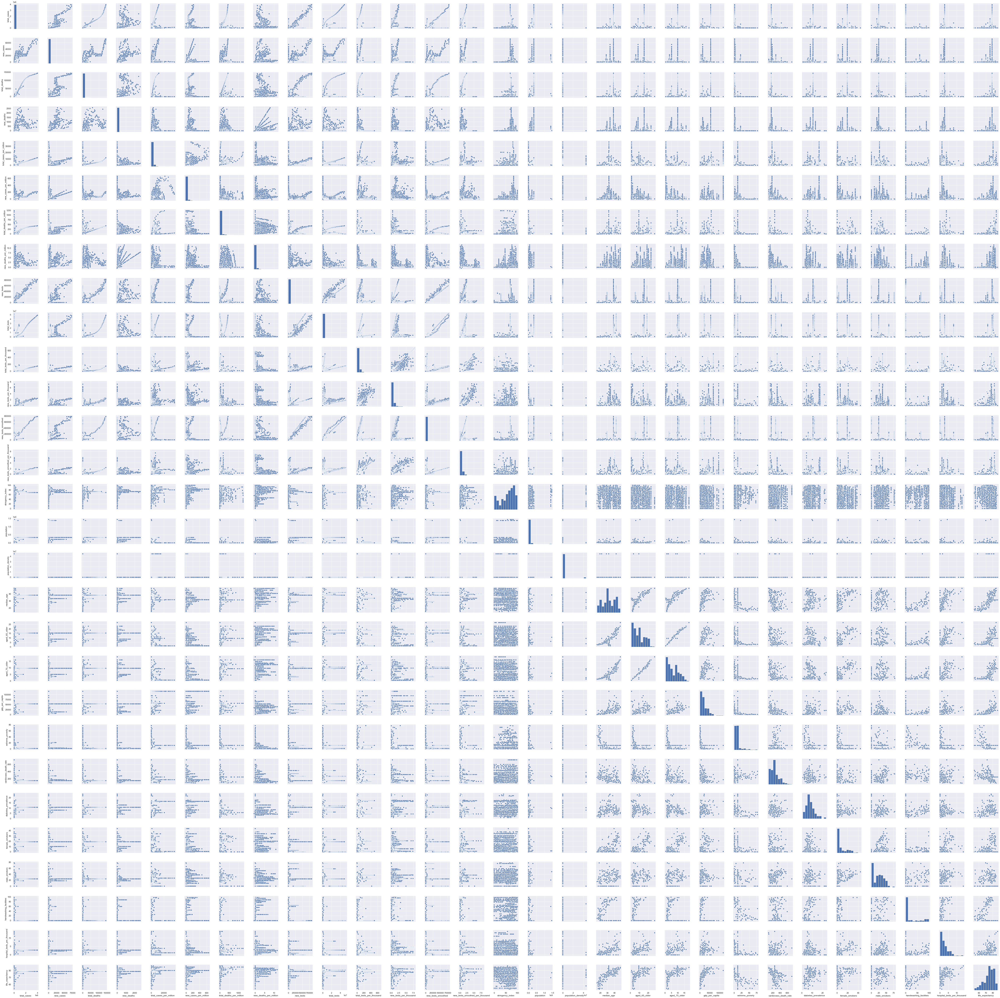

In [50]:
df_PairPlot=sns.pairplot(df)

# Feature Selection

<font color = 'teal'>Create a heatmap to find the correlations between the features of the dataframe df</font>

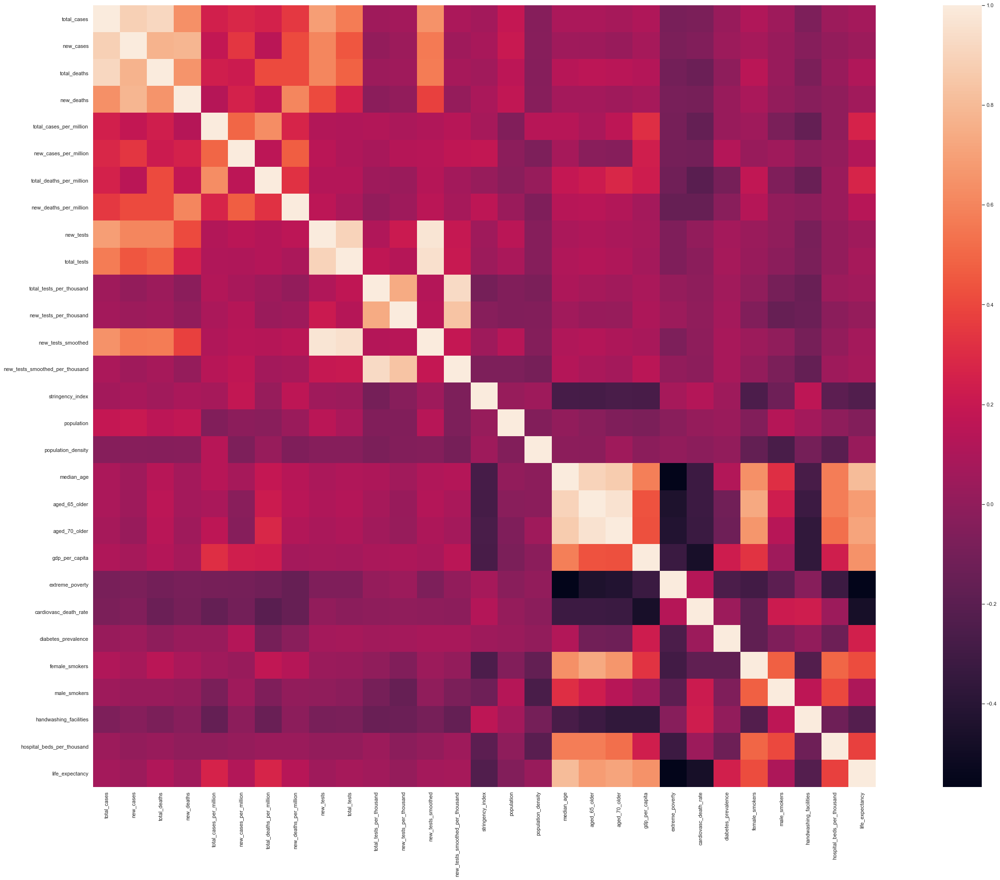

In [51]:
#Lets plot the heatmap to find correlation among the features
sns.set(rc={'figure.figsize': (50,30)})
corr = df.corr()
sns.heatmap(corr,square = True)

In [52]:
#Step 1. Call the variable corr_matrix
corr_matrix = df.drop(['total_cases','new_cases','total_deaths','new_deaths'], axis=1).corr().abs()

#Step 2.the following code is to get the upper triangle of the correlation matrix 
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

#Step 3. This code iterates through our columns and gets the index of any that have a correlation > 0.95
#Call the variable to_drop and store the column that are more than 90% correlated for removal.
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]

In [53]:
#Priting the column names which are 90% correlated for removal 
print('Features selected to drop is ',to_drop)

Features selected to drop is  ['new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'aged_65_older', 'aged_70_older']


In [54]:
#Now drop the columns from the datafram df which are more than 90% correlated for removal
df = df.drop(df[to_drop],axis=1)

In [55]:
df.shape

(26081, 29)

In [56]:
df.to_csv("step_3_output.csv")